In [1]:
import random
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np
import torch
from torch import optim
import torchvision
import torch.nn as nn
import torchvision.datasets as dsets
import torchvision.utils as vutils
import torchvision.transforms as transforms
from IPython import display
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

In [32]:
manualSeed = 777 
random.seed(manualSeed) 
torch.manual_seed(manualSeed)

In [33]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [34]:
nz = 100 # 노이즈 벡터의 크기
nc = 3 # 채널의 수
ngf = 128 # generator 필터 조정
ndf = 64 # discriminator 필터 조정
num_epochs = 15 # 에폭 수
lr = 0.0002
beta1 = 0.5

image_size = 64 # 만들어지는 이미지의 크기
batch_size = 128 # 미니배치의 크기

In [5]:
transform = transforms.Compose([
        transforms.Scale(64),
        transforms.ToTensor(),                     
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

train_dataset = dsets.CIFAR10(root='./data/', train=True, download=True, transform=transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size= batch_size, shuffle=True)

/usr/local/lib/python3.6/dist-packages/torchvision/transforms/transforms.py:280: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  "please use transforms.Resize instead.")


Extracting ./data/cifar-10-python.tar.gz to ./data/


In [35]:
def weights_init(m):
  classname = m.__class__.__name__

  if classname.find('Conv') != -1:         # Conv weight init
    nn.init.normal_(m.weight.data, 0.0, 0.02)

  elif classname.find('BatchNorm') != -1:  # BatchNorm weight init
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data,0)

In [7]:
class Generator(nn.Module): 
  def __init__(self):
    super(Generator, self).__init__() 
    self.main = nn.Sequential( # input : z 벡터 
                              nn.ConvTranspose2d(in_channels=nz, out_channels=ngf*8, kernel_size=4, stride=1, padding=0, bias=False),
                              nn.BatchNorm2d(ngf*8), 
                              nn.ReLU(True),

                              # state size. (ngf*8) * 4 * 4 
                              nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False), 
                              nn.BatchNorm2d(ngf*4), 
                              nn.ReLU(True), 

                              # (ngf*8) * 8 * 8 
                              nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False), 
                              nn.BatchNorm2d(ngf*2), 
                              nn.ReLU(True), 

                              # (ngf*2) * 16 * 16 
                              nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False), 
                              nn.BatchNorm2d(ngf), 
                              nn.ReLU(True), 

                              # ngf * 32 * 32 
                              nn.ConvTranspose2d(ngf,nc,4,2,1,bias=False), 
                              nn.Tanh() 
                              # nc * 64 * 64 
                              ) 
                        
  def forward(self,input): 
    return self.main(input)

In [36]:
netG=Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()


In [20]:
class Discriminator(nn.Module):
  def __init__(self): 
    super(Discriminator, self).__init__()
    self.main = nn.Sequential( # input : nc * 64 * 64 
                              nn.Conv2d(nc, ndf, 5, 2, 2, bias=False), 
                              nn.LeakyReLU(0.2, inplace=True), 

                              # ndf * 32 * 32 
                              nn.Conv2d(ndf,ndf*2, 5, 2, 2, bias=False), 
                              nn.BatchNorm2d(ndf*2), 
                              nn.LeakyReLU(0.2, inplace=True), 

                              # (ndf*2) * 16 *16 
                              nn.Conv2d(ndf*2, ndf*4, 5, 2, 2, bias=False), 
                              nn.BatchNorm2d(ndf*4), 
                              nn.LeakyReLU(0.2, inplace=True), 

                              # (ndf*4) * 8 * 8 
                              nn.Conv2d(ndf*4, ndf*8, 5, 2, 2, bias=False), 
                              nn.BatchNorm2d(ndf*8), 
                              nn.LeakyReLU(0.2, inplace=True), 

                              # (ndf*8) * 4 * 4 
                              nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False), 
                              nn.Sigmoid()
                              ) 
    
  def forward(self,input): 
    return self.main(input)

In [37]:
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [38]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

real_label=1
fake_label=0

optimizer_D = optim.Adam(netD.parameters(),lr=lr, betas=(beta1,0.999))
optimizer_G = optim.Adam(netG.parameters(),lr=lr, betas=(beta1,0.999))

[ 1/15][ 50/391]	Loss_D: 1.4708,	Loss_G: 15.2706,	D(x): 0.7590	D(G(z)): 0.3229 / 0.0002
[ 1/15][100/391]	Loss_D: 0.6065,	Loss_G: 13.1693,	D(x): 0.8636	D(G(z)): 0.1313 / 0.0014
[ 1/15][150/391]	Loss_D: 0.9300,	Loss_G: 4.1354,	D(x): 0.7257	D(G(z)): 0.2614 / 0.0697
[ 1/15][200/391]	Loss_D: 0.6412,	Loss_G: 4.3366,	D(x): 0.7806	D(G(z)): 0.2147 / 0.0489
[ 1/15][250/391]	Loss_D: 0.8626,	Loss_G: 5.8043,	D(x): 0.7865	D(G(z)): 0.2061 / 0.0590
[ 1/15][300/391]	Loss_D: 0.7156,	Loss_G: 3.6008,	D(x): 0.7620	D(G(z)): 0.2306 / 0.0685
[ 1/15][350/391]	Loss_D: 0.9931,	Loss_G: 2.9804,	D(x): 0.6846	D(G(z)): 0.2959 / 0.1072


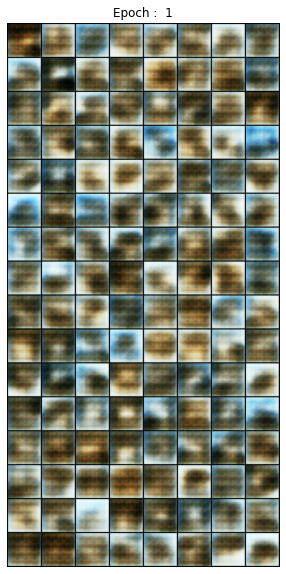

[ 2/15][ 50/391]	Loss_D: 0.8630,	Loss_G: 3.7307,	D(x): 0.7341	D(G(z)): 0.2593 / 0.0759
[ 2/15][100/391]	Loss_D: 0.8521,	Loss_G: 3.7289,	D(x): 0.7364	D(G(z)): 0.2699 / 0.0857
[ 2/15][150/391]	Loss_D: 0.4830,	Loss_G: 4.2957,	D(x): 0.8212	D(G(z)): 0.1699 / 0.0414
[ 2/15][200/391]	Loss_D: 0.5745,	Loss_G: 4.8457,	D(x): 0.8087	D(G(z)): 0.1761 / 0.0325
[ 2/15][250/391]	Loss_D: 0.7954,	Loss_G: 5.0164,	D(x): 0.7733	D(G(z)): 0.2144 / 0.0425
[ 2/15][300/391]	Loss_D: 0.5735,	Loss_G: 4.4020,	D(x): 0.8340	D(G(z)): 0.1703 / 0.0467
[ 2/15][350/391]	Loss_D: 0.7759,	Loss_G: 3.7769,	D(x): 0.7523	D(G(z)): 0.2453 / 0.0790


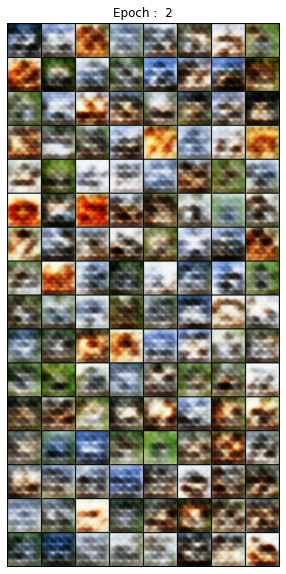

[ 3/15][ 50/391]	Loss_D: 1.0277,	Loss_G: 2.7994,	D(x): 0.6944	D(G(z)): 0.3027 / 0.1435
[ 3/15][100/391]	Loss_D: 0.6144,	Loss_G: 3.2076,	D(x): 0.7791	D(G(z)): 0.2135 / 0.0864
[ 3/15][150/391]	Loss_D: 0.7711,	Loss_G: 3.4876,	D(x): 0.7534	D(G(z)): 0.2418 / 0.0867
[ 3/15][200/391]	Loss_D: 0.8083,	Loss_G: 3.1611,	D(x): 0.7395	D(G(z)): 0.2582 / 0.1000
[ 3/15][250/391]	Loss_D: 0.8674,	Loss_G: 3.0782,	D(x): 0.7191	D(G(z)): 0.2737 / 0.1090
[ 3/15][300/391]	Loss_D: 0.7379,	Loss_G: 2.9350,	D(x): 0.7526	D(G(z)): 0.2576 / 0.1062
[ 3/15][350/391]	Loss_D: 0.9470,	Loss_G: 2.8714,	D(x): 0.6977	D(G(z)): 0.3011 / 0.1274


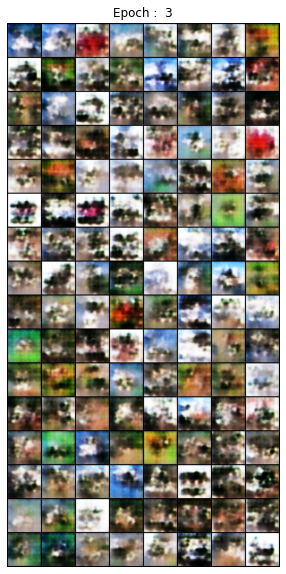

[ 4/15][ 50/391]	Loss_D: 0.8915,	Loss_G: 3.0162,	D(x): 0.7259	D(G(z)): 0.2695 / 0.1227
[ 4/15][100/391]	Loss_D: 0.8082,	Loss_G: 2.6368,	D(x): 0.7294	D(G(z)): 0.2743 / 0.1370
[ 4/15][150/391]	Loss_D: 0.8476,	Loss_G: 3.0673,	D(x): 0.7282	D(G(z)): 0.2682 / 0.1099
[ 4/15][200/391]	Loss_D: 0.6737,	Loss_G: 2.9465,	D(x): 0.7593	D(G(z)): 0.2314 / 0.1226
[ 4/15][250/391]	Loss_D: 0.8095,	Loss_G: 3.1969,	D(x): 0.7440	D(G(z)): 0.2568 / 0.1008
[ 4/15][300/391]	Loss_D: 0.6235,	Loss_G: 3.0830,	D(x): 0.7720	D(G(z)): 0.2179 / 0.1039
[ 4/15][350/391]	Loss_D: 0.7973,	Loss_G: 2.9602,	D(x): 0.7439	D(G(z)): 0.2579 / 0.1196


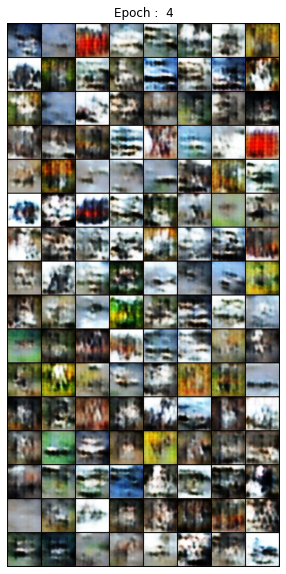

[ 5/15][ 50/391]	Loss_D: 0.8459,	Loss_G: 2.5587,	D(x): 0.7140	D(G(z)): 0.2750 / 0.1475
[ 5/15][100/391]	Loss_D: 0.8712,	Loss_G: 2.5407,	D(x): 0.7076	D(G(z)): 0.2961 / 0.1471
[ 5/15][150/391]	Loss_D: 0.9830,	Loss_G: 2.5731,	D(x): 0.6916	D(G(z)): 0.3037 / 0.1650
[ 5/15][200/391]	Loss_D: 0.9296,	Loss_G: 2.4144,	D(x): 0.6918	D(G(z)): 0.3114 / 0.1695
[ 5/15][250/391]	Loss_D: 1.0150,	Loss_G: 2.3474,	D(x): 0.6686	D(G(z)): 0.3271 / 0.1766
[ 5/15][300/391]	Loss_D: 0.9375,	Loss_G: 2.2625,	D(x): 0.6805	D(G(z)): 0.3158 / 0.1744
[ 5/15][350/391]	Loss_D: 0.8530,	Loss_G: 2.2707,	D(x): 0.7035	D(G(z)): 0.2987 / 0.1657


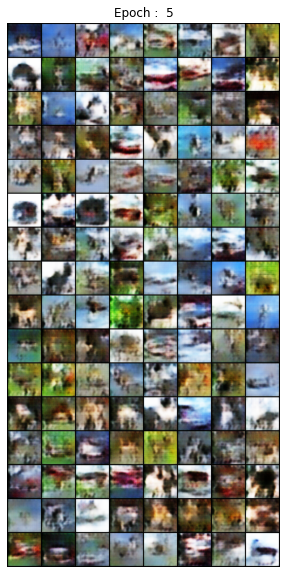

[ 6/15][ 50/391]	Loss_D: 1.0043,	Loss_G: 2.4268,	D(x): 0.6767	D(G(z)): 0.3276 / 0.1766
[ 6/15][100/391]	Loss_D: 1.0164,	Loss_G: 2.2049,	D(x): 0.6639	D(G(z)): 0.3288 / 0.1976
[ 6/15][150/391]	Loss_D: 0.9861,	Loss_G: 2.3307,	D(x): 0.6738	D(G(z)): 0.3309 / 0.1731
[ 6/15][200/391]	Loss_D: 0.9987,	Loss_G: 2.2349,	D(x): 0.6690	D(G(z)): 0.3320 / 0.1849
[ 6/15][250/391]	Loss_D: 1.0559,	Loss_G: 2.1634,	D(x): 0.6525	D(G(z)): 0.3426 / 0.1943
[ 6/15][300/391]	Loss_D: 1.0933,	Loss_G: 2.0597,	D(x): 0.6477	D(G(z)): 0.3558 / 0.2115
[ 6/15][350/391]	Loss_D: 1.0664,	Loss_G: 1.9973,	D(x): 0.6389	D(G(z)): 0.3521 / 0.2066


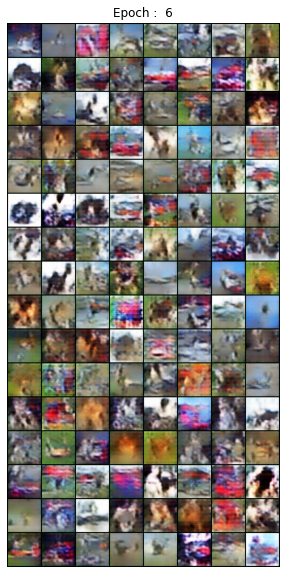

[ 7/15][ 50/391]	Loss_D: 1.0105,	Loss_G: 2.0914,	D(x): 0.6610	D(G(z)): 0.3380 / 0.1960
[ 7/15][100/391]	Loss_D: 1.1086,	Loss_G: 2.1150,	D(x): 0.6408	D(G(z)): 0.3565 / 0.2057
[ 7/15][150/391]	Loss_D: 1.0025,	Loss_G: 1.9047,	D(x): 0.6555	D(G(z)): 0.3432 / 0.2160
[ 7/15][200/391]	Loss_D: 1.0734,	Loss_G: 1.8338,	D(x): 0.6397	D(G(z)): 0.3628 / 0.2362
[ 7/15][250/391]	Loss_D: 1.0679,	Loss_G: 2.0519,	D(x): 0.6541	D(G(z)): 0.3532 / 0.2026
[ 7/15][300/391]	Loss_D: 1.1170,	Loss_G: 1.9314,	D(x): 0.6272	D(G(z)): 0.3567 / 0.2238
[ 7/15][350/391]	Loss_D: 0.9881,	Loss_G: 1.9072,	D(x): 0.6609	D(G(z)): 0.3408 / 0.2113


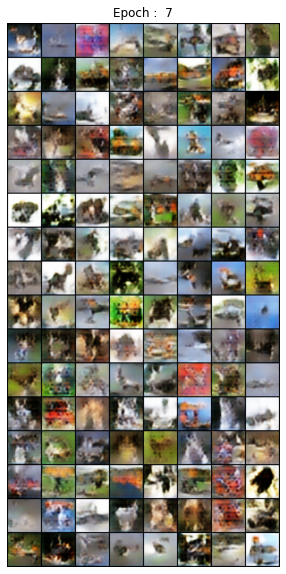

[ 8/15][ 50/391]	Loss_D: 0.9868,	Loss_G: 1.8597,	D(x): 0.6550	D(G(z)): 0.3378 / 0.2117
[ 8/15][100/391]	Loss_D: 1.1129,	Loss_G: 2.0646,	D(x): 0.6479	D(G(z)): 0.3481 / 0.2257
[ 8/15][150/391]	Loss_D: 0.9130,	Loss_G: 2.0724,	D(x): 0.6782	D(G(z)): 0.3165 / 0.1871
[ 8/15][200/391]	Loss_D: 0.9869,	Loss_G: 2.0323,	D(x): 0.6654	D(G(z)): 0.3396 / 0.1989
[ 8/15][250/391]	Loss_D: 0.9658,	Loss_G: 2.0633,	D(x): 0.6732	D(G(z)): 0.3218 / 0.1990
[ 8/15][300/391]	Loss_D: 1.0719,	Loss_G: 2.0081,	D(x): 0.6615	D(G(z)): 0.3424 / 0.2157
[ 8/15][350/391]	Loss_D: 1.1319,	Loss_G: 1.8437,	D(x): 0.6439	D(G(z)): 0.3509 / 0.2476


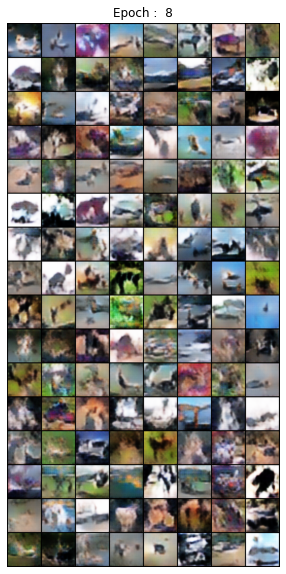

[ 9/15][ 50/391]	Loss_D: 1.0058,	Loss_G: 2.0222,	D(x): 0.6767	D(G(z)): 0.3249 / 0.2111
[ 9/15][100/391]	Loss_D: 1.0584,	Loss_G: 1.9626,	D(x): 0.6535	D(G(z)): 0.3389 / 0.2281
[ 9/15][150/391]	Loss_D: 0.9374,	Loss_G: 2.0063,	D(x): 0.6782	D(G(z)): 0.3225 / 0.2039
[ 9/15][200/391]	Loss_D: 0.9691,	Loss_G: 2.0692,	D(x): 0.6841	D(G(z)): 0.3102 / 0.2033
[ 9/15][250/391]	Loss_D: 0.9988,	Loss_G: 1.9343,	D(x): 0.6616	D(G(z)): 0.3376 / 0.2196
[ 9/15][300/391]	Loss_D: 0.8517,	Loss_G: 2.0763,	D(x): 0.7046	D(G(z)): 0.3002 / 0.1960
[ 9/15][350/391]	Loss_D: 1.0398,	Loss_G: 2.0376,	D(x): 0.6592	D(G(z)): 0.3452 / 0.2204


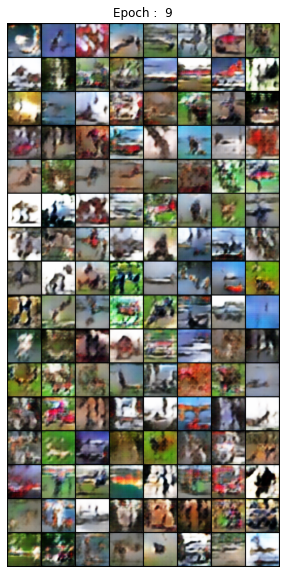

[10/15][ 50/391]	Loss_D: 0.9678,	Loss_G: 2.2088,	D(x): 0.6851	D(G(z)): 0.3078 / 0.2005
[10/15][100/391]	Loss_D: 0.9444,	Loss_G: 2.1213,	D(x): 0.6784	D(G(z)): 0.3158 / 0.1943
[10/15][150/391]	Loss_D: 1.0543,	Loss_G: 1.9258,	D(x): 0.6536	D(G(z)): 0.3549 / 0.2203
[10/15][200/391]	Loss_D: 1.0659,	Loss_G: 1.9525,	D(x): 0.6501	D(G(z)): 0.3496 / 0.2199
[10/15][250/391]	Loss_D: 0.9535,	Loss_G: 1.9890,	D(x): 0.6720	D(G(z)): 0.3245 / 0.2058
[10/15][300/391]	Loss_D: 1.0090,	Loss_G: 1.9911,	D(x): 0.6682	D(G(z)): 0.3336 / 0.2148
[10/15][350/391]	Loss_D: 1.0006,	Loss_G: 1.9598,	D(x): 0.6648	D(G(z)): 0.3342 / 0.2120


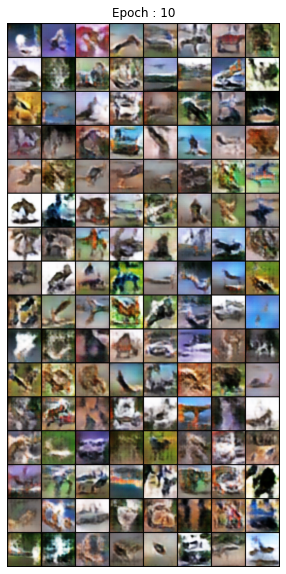

[11/15][ 50/391]	Loss_D: 1.0082,	Loss_G: 1.9262,	D(x): 0.6537	D(G(z)): 0.3362 / 0.2106
[11/15][100/391]	Loss_D: 1.0683,	Loss_G: 1.8583,	D(x): 0.6427	D(G(z)): 0.3638 / 0.2222
[11/15][150/391]	Loss_D: 1.0141,	Loss_G: 1.8756,	D(x): 0.6574	D(G(z)): 0.3429 / 0.2236
[11/15][200/391]	Loss_D: 1.0655,	Loss_G: 1.8597,	D(x): 0.6480	D(G(z)): 0.3466 / 0.2298
[11/15][250/391]	Loss_D: 1.0645,	Loss_G: 1.8830,	D(x): 0.6493	D(G(z)): 0.3493 / 0.2246
[11/15][300/391]	Loss_D: 1.0642,	Loss_G: 1.8500,	D(x): 0.6472	D(G(z)): 0.3647 / 0.2274
[11/15][350/391]	Loss_D: 1.0820,	Loss_G: 1.8419,	D(x): 0.6388	D(G(z)): 0.3550 / 0.2270


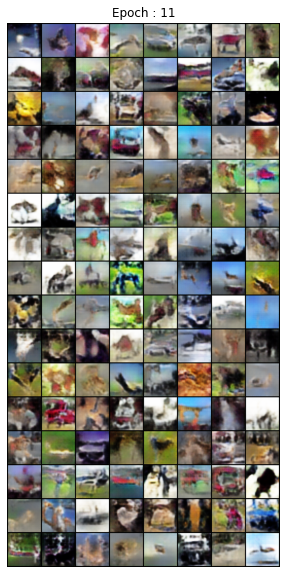

[12/15][ 50/391]	Loss_D: 1.0356,	Loss_G: 1.8366,	D(x): 0.6518	D(G(z)): 0.3520 / 0.2264
[12/15][100/391]	Loss_D: 1.0529,	Loss_G: 1.8273,	D(x): 0.6567	D(G(z)): 0.3476 / 0.2395
[12/15][150/391]	Loss_D: 1.0642,	Loss_G: 1.8091,	D(x): 0.6390	D(G(z)): 0.3455 / 0.2405
[12/15][200/391]	Loss_D: 1.0257,	Loss_G: 1.8102,	D(x): 0.6503	D(G(z)): 0.3569 / 0.2243
[12/15][250/391]	Loss_D: 1.2282,	Loss_G: 1.7402,	D(x): 0.6133	D(G(z)): 0.3881 / 0.2577
[12/15][300/391]	Loss_D: 1.0282,	Loss_G: 1.7116,	D(x): 0.6444	D(G(z)): 0.3551 / 0.2441
[12/15][350/391]	Loss_D: 1.0829,	Loss_G: 1.7228,	D(x): 0.6374	D(G(z)): 0.3642 / 0.2456


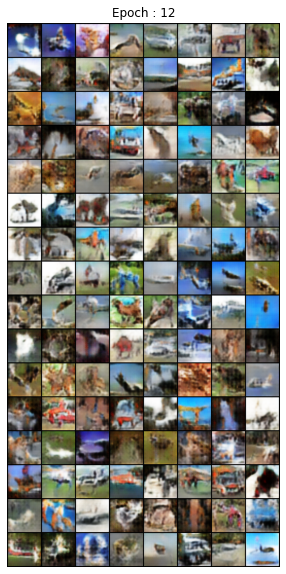

[13/15][ 50/391]	Loss_D: 1.0036,	Loss_G: 1.7791,	D(x): 0.6506	D(G(z)): 0.3575 / 0.2243
[13/15][100/391]	Loss_D: 1.0775,	Loss_G: 1.7483,	D(x): 0.6331	D(G(z)): 0.3564 / 0.2440
[13/15][150/391]	Loss_D: 1.0184,	Loss_G: 1.8163,	D(x): 0.6553	D(G(z)): 0.3472 / 0.2329
[13/15][200/391]	Loss_D: 1.0420,	Loss_G: 1.7840,	D(x): 0.6466	D(G(z)): 0.3553 / 0.2314
[13/15][250/391]	Loss_D: 1.0695,	Loss_G: 1.6744,	D(x): 0.6327	D(G(z)): 0.3606 / 0.2565
[13/15][300/391]	Loss_D: 1.1244,	Loss_G: 1.7822,	D(x): 0.6337	D(G(z)): 0.3735 / 0.2409
[13/15][350/391]	Loss_D: 1.1108,	Loss_G: 1.7403,	D(x): 0.6316	D(G(z)): 0.3704 / 0.2478


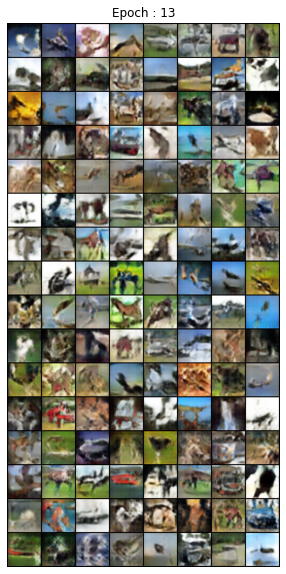

[14/15][ 50/391]	Loss_D: 1.0010,	Loss_G: 1.8209,	D(x): 0.6530	D(G(z)): 0.3443 / 0.2271
[14/15][100/391]	Loss_D: 0.9731,	Loss_G: 1.8355,	D(x): 0.6665	D(G(z)): 0.3409 / 0.2251
[14/15][150/391]	Loss_D: 1.1126,	Loss_G: 1.7018,	D(x): 0.6264	D(G(z)): 0.3674 / 0.2481
[14/15][200/391]	Loss_D: 1.0299,	Loss_G: 1.7550,	D(x): 0.6489	D(G(z)): 0.3436 / 0.2381
[14/15][250/391]	Loss_D: 1.4385,	Loss_G: 1.6655,	D(x): 0.6085	D(G(z)): 0.4076 / 0.3008
[14/15][300/391]	Loss_D: 1.2627,	Loss_G: 1.3607,	D(x): 0.5732	D(G(z)): 0.4204 / 0.3102
[14/15][350/391]	Loss_D: 1.0325,	Loss_G: 1.6081,	D(x): 0.6395	D(G(z)): 0.3561 / 0.2579


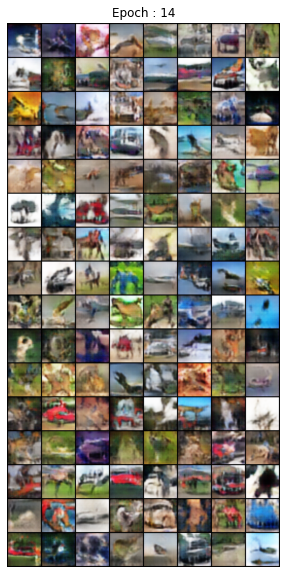

[15/15][ 50/391]	Loss_D: 0.9796,	Loss_G: 1.7306,	D(x): 0.6540	D(G(z)): 0.3469 / 0.2360
[15/15][100/391]	Loss_D: 1.0749,	Loss_G: 1.7520,	D(x): 0.6326	D(G(z)): 0.3637 / 0.2401
[15/15][150/391]	Loss_D: 0.9610,	Loss_G: 1.7872,	D(x): 0.6625	D(G(z)): 0.3411 / 0.2291
[15/15][200/391]	Loss_D: 1.1077,	Loss_G: 1.7210,	D(x): 0.6313	D(G(z)): 0.3664 / 0.2529
[15/15][250/391]	Loss_D: 1.1586,	Loss_G: 1.7010,	D(x): 0.6265	D(G(z)): 0.3748 / 0.2553
[15/15][300/391]	Loss_D: 1.0268,	Loss_G: 1.7151,	D(x): 0.6430	D(G(z)): 0.3561 / 0.2397
[15/15][350/391]	Loss_D: 1.0220,	Loss_G: 1.7859,	D(x): 0.6508	D(G(z)): 0.3464 / 0.2364


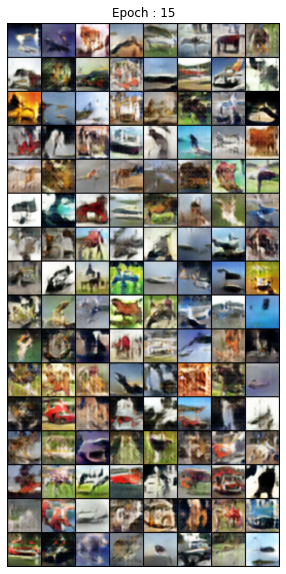

In [39]:
# Training 
img_list = [] 
G_losses = [] 
D_losses = [] 

for epoch in range(num_epochs): 
  G_loss=0
  D_loss=0
  Dx=0
  DGz1=0
  DGz2=0
  for i, data in enumerate(train_loader):

    # Update D
    netD.zero_grad() 
    real_cpu = data[0].to(device) 
    b_size = real_cpu.size(0) 
    label_real=torch.ones(b_size).to(device)
    
    output = netD(real_cpu).view(-1) 
    errD_real = criterion(output,label_real) 
     
    D_x = output.mean().item()

    noise = torch.randn(b_size,nz,1,1,device=device) 
    fake = netG(noise) 
    label_fake=torch.zeros(b_size).to(device)
    output = netD(fake.detach()).view(-1) 
    errD_fake = criterion(output,label_fake) 
     
    D_G_z1 = output.mean().item()

    errD = errD_real + errD_fake 
    errD.backward()
    optimizer_D.step()

    # Update G 
    netG.zero_grad() 
    output = netD(fake).view(-1) 
    errG = criterion(output,label_real) 
    errG.backward() 
    D_G_z2 = output.mean().item() 

    optimizer_G.step()
    
    G_loss += errG.item()
    D_loss += errD.item()
    Dx += D_x
    DGz1 += D_G_z1
    DGz2 += D_G_z2

    if i % 50==49:
      print('[%2d/%2d][%3d/%3d]\tLoss_D: %.4f,\tLoss_G: %.4f,\tD(x): %.4f\tD(G(z)): %.4f / %.4f' % (epoch+1, num_epochs, i+1, len(train_loader), D_loss/50, G_loss/50, Dx/50, DGz1/50, DGz2/50))
      G_losses.append(G_loss/50)
      D_losses.append(D_loss/50)
      G_loss=0
      D_loss=0
      Dx=0
      DGz1=0
      DGz2=0

  with torch.no_grad():
    fake=netG(fixed_noise)
  img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
  plt.figure(figsize=(5,10))
  plt.axis("off") 
  plt.title("Epoch : %2d"%(epoch+1)) 
  plt.imshow(np.transpose(img_list[-1].cpu(),(1,2,0))) 
  plt.show()

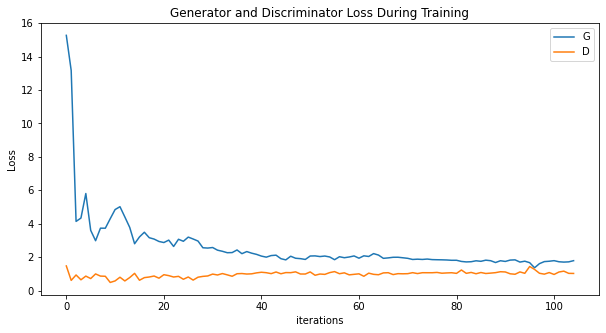

In [40]:
plt.figure(figsize=(10,5)) 
plt.title("Generator and Discriminator Loss During Training") 
plt.plot(G_losses,label="G") 
plt.plot(D_losses,label="D") 
plt.xlabel("iterations") 
plt.ylabel("Loss") 
plt.legend() 
plt.show()

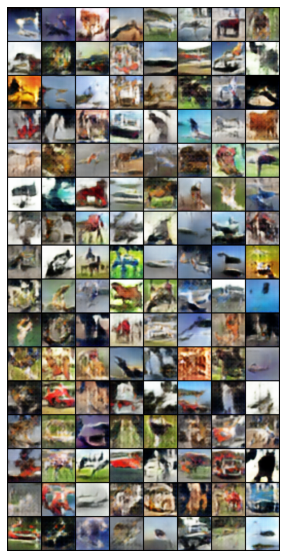

In [41]:
fig = plt.figure(figsize=(5,10)) 
plt.axis("off") 
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in img_list] 
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True) 
HTML(ani.to_jshtml())

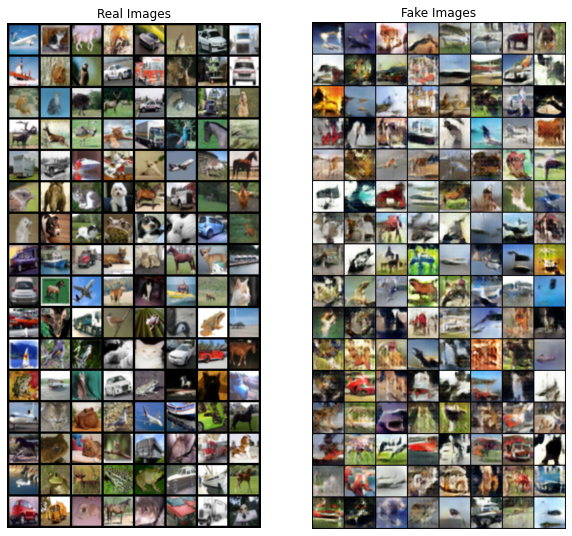

In [42]:
real_batch=next(iter(train_loader))
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:128], padding=5, normalize=True).cpu(),(1,2,0)))


plt.subplot(1,2,2)
plt.axis("off") 
plt.title("Fake Images") 
plt.imshow(np.transpose(img_list[-1].cpu(),(1,2,0))) 
plt.show()